# 

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

This is a modified verion of the original Detectron2 Tutorial notebook. It is focussed on the training for instance segmentation. In this case Plankton from the PIScO System.

The original notebook can be found on the [Detectron2 Github repo](https://github.com/facebookresearch/detectron2).

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and make changes there. __DO NOT__ request access to this tutorial.


# Install detectron2

In [ ]:
!pip install pyyaml==5.1
# This is the current pytorch version on Colab. Uncomment this if Colab changes its pytorch version
!pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html

# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 32.2 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=19799ee6046b54eeceafcd25354161bfb724ce89a2cf10d54e94fd3b816047b4
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.0 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org

In [ ]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version

1.9.0+cu102 True


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="BWA9KVFYBHpuoXtFQYBQ")
project = rf.workspace("vdausmann-posteo-de").project("plankton_640_peru")
dataset = project.version(1).download("coco-segmentation")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 145 kB 39.2 MB/s 
     |████████████████████████████████| 178 kB 64.0 MB/s 
     |████████████████████████████████| 1.1 MB 52.5 MB/s 
     |████████████████████████████████| 67 kB 5.8 MB/s 
     |████████████████████████████████| 54 kB 2.5 MB/s 
     |████████████████████████████████| 138 kB 75.4 MB/s 
     |████████████████████████████████| 596 kB 49.4 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.14-py3-none-any.whl size=24837 sha256=e36b717d30cfa69bccea6157b66606e5fa5d11eb74fedebb5287e78177fd0e25
  Stored in directory: /root/.cache/pip/wheels/c7/84/36/a6a32c749ead923690d15d20443fb53fa2fe10beaa408f371b
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=ccb47224555a01bbfb6ed2af9a0d446fc47cb7734f6d236be03818e3e8da4231
  Stored in directory: /root/.cache/pi

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Plankton_640_Peru-1 in coco-segmentation:: 100%|██████████| 7109/7109 [00:03<00:00, 2296.65it/s]


In [ ]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
from detectron2.data.datasets import register_coco_instances
my_dataset_train = register_coco_instances("my_dataset_train", {}, "/content/Plankton_640_Peru-1/train/_annotations.coco.json", "/content/Plankton_640_Peru-1/train")
#register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "/content/drive/MyDrive/ds0/images")

from detectron2.data.datasets import load_coco_json

my_dataset_loaded = load_coco_json("/content/Plankton_640_Peru-1/train/_annotations.coco.json", "/content/Plankton_640_Peru-1/train", dataset_name="Plankton", extra_annotation_keys=None)





WARNING [08/24 12:03:10 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/24 12:03:10 d2.data.datasets.coco]: Loaded 6182 images in COCO format from /content/Plankton_640_Peru-1/train/_annotations.coco.json


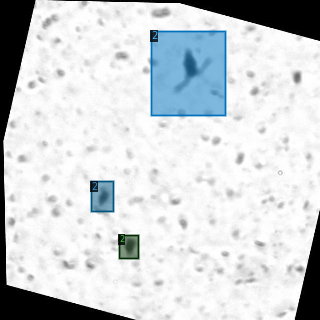

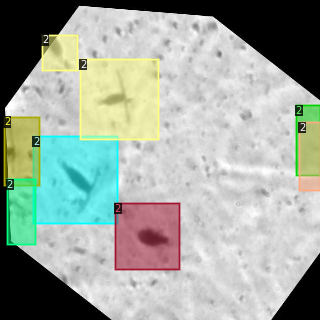

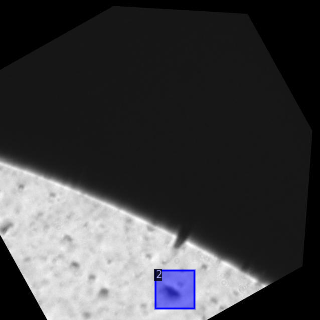

In [ ]:
#dataset_dicts = get_balloon_dicts("balloon/train")
for d in random.sample(my_dataset_loaded, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 3000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[08/24 12:03:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:20, 8.48MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[08/24 12:03:48 d2.engine.train_loop]: Starting training from iteration 0
[08/24 12:03:56 d2.utils.events]:  eta: 0:17:46  iter: 19  total_loss: 3.103  loss_cls: 2.099  loss_box_reg: 0.09122  loss_mask: 0.6901  loss_rpn_cls: 0.1917  loss_rpn_loc: 0.01904  time: 0.3498  data_time: 0.0184  lr: 4.9953e-06  max_mem: 2205M
[08/24 12:04:03 d2.utils.events]:  eta: 0:17:58  iter: 39  total_loss: 2.816  loss_cls: 1.8  loss_box_reg: 0.09142  loss_mask: 0.6821  loss_rpn_cls: 0.2681  loss_rpn_loc: 0.02606  time: 0.3603  data_time: 0.0070  lr: 9.9902e-06  max_mem: 2205M
[08/24 12:04:10 d2.utils.events]:  eta: 0:17:45  iter: 59  total_loss: 2.25  loss_cls: 1.28  loss_box_reg: 0.09845  loss_mask: 0.6677  loss_rpn_cls: 0.1985  loss_rpn_loc: 0.03495  time: 0.3632  data_time: 0.0095  lr: 1.4985e-05  max_mem: 2205M
[08/24 12:04:18 d2.utils.events]:  eta: 0:17:37  iter: 79  total_loss: 1.727  loss_cls: 0.7901  loss_box_reg: 0.1131  loss_mask: 0.6484  loss_rpn_cls: 0.1384  loss_rpn_loc: 0.01956  time: 0.36

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1379), started 0:19:24 ago. (Use '!kill 1379' to kill it.)

<IPython.core.display.Javascript object>

# Run the just trained detectron2 model

### Instance Segmentation
["...instance segmentation, we care about detection and segmentation of the instances of objects separately"](https://kharshit.github.io/blog/2019/08/23/quick-intro-to-instance-segmentation)

In other words, we perform segmentation only on the objects detected within the bounding box of object detection.

In [ ]:
# Only needed when runing a pretrained model 
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = '/content/drive/MyDrive/plankton_classifier/maskRCNN/model_final.pth'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

AssertionError: ignored

This cell activates Thelma's model pretrained on ISIIS images:

In [ ]:
cfg2 = get_cfg()
cfg2.merge_from_file("/content/drive/MyDrive/Thelmas_model/my_cfg.yaml")
cfg2.MODEL.WEIGHTS = "/content/drive/MyDrive/Thelmas_model/model_final.pth"  # path to the pretrained model 
cfg2.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1   # set a custom testing threshold
predictor = DefaultPredictor(cfg2)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


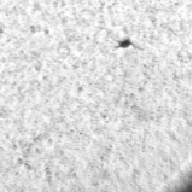

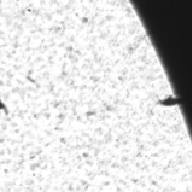

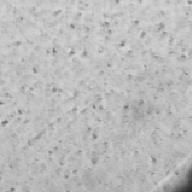

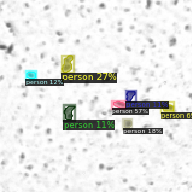

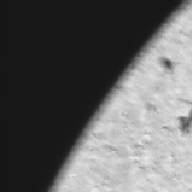

...

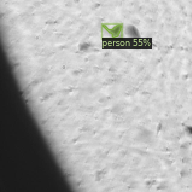

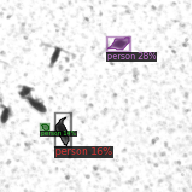

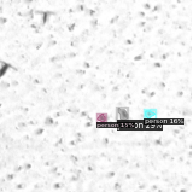

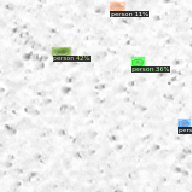

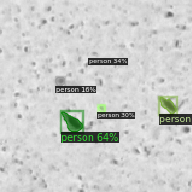

KeyboardInterrupt: ignored

In [ ]:
for i in os.listdir("/content/Plankton_640_Peru-1/test"):
  im = cv2.imread(os.path.join("/content/Plankton_640_Peru-1/test/",i))
  im = cv2.resize(im, (160, 160), interpolation= cv2.INTER_AREA)
  predictions = predictor(im)["instances"]
# We can use `Visualizer` to draw the predictions on the image.
  v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
  out = v.draw_instance_predictions(predictions.to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
#cv2_imshow(im)

### Object Detection
["...object detection, where the goal is to classify individual objects and localize them using a bounding box..."](https://kharshit.github.io/blog/2019/08/23/quick-intro-to-instance-segmentation)

In [ ]:
# Object Detection
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/plankton_classifier/maskRCNN/model_final.pth"
predictor = DefaultPredictor(cfg)

NameError: ignored

In [ ]:
# Object Detection Visualizer
predictions = predictor(im)["instances"]
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(predictions.to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

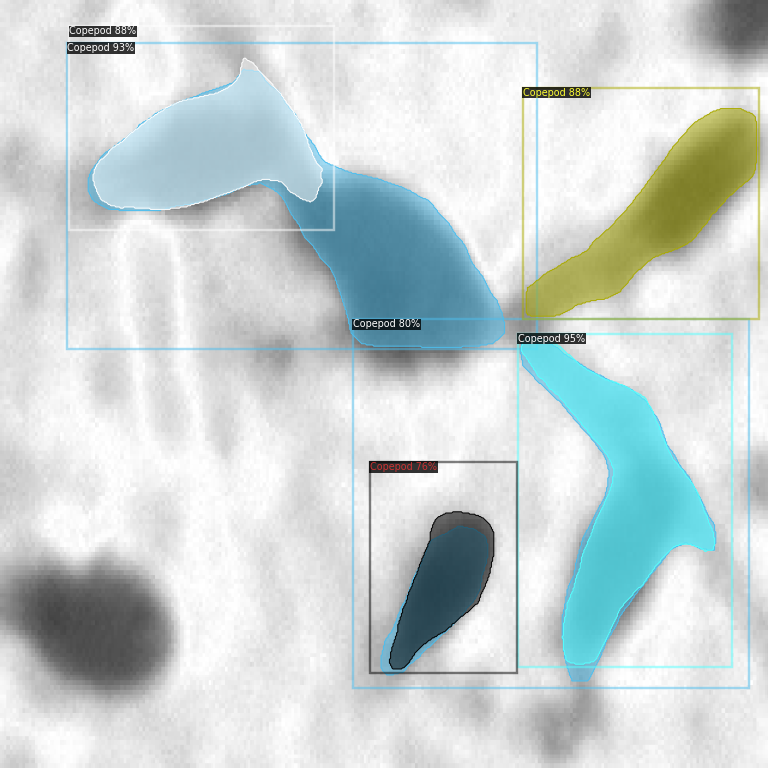

In [ ]:
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=balloon_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])
# Instance Segmentation Visualizer
predictions = predictor(im)["instances"]
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(predictions.to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

### Panoptic Segmentation
["...panoptic segmentation combines semantic and instance segmentation such that all pixels are assigned a class label and all object instances are uniquely segmented."](https://kharshit.github.io/blog/2019/10/18/introduction-to-panoptic-segmentation-tutorial)

Panoptic segmentation classifies all pixels in the image within a polygonal bounding area including objects and background scenery. Unlike, object and Instance segmentation which only care about individual objects in the image.



In [ ]:
# Panoptic Segmentation
# Ref: https://youtu.be/Pb3opEFP94U
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)

Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
backbone.bottom_up.res3.0.conv2_offset.{bias, weight}
backbone.bottom_up.res3.1.conv2_offset.{bias, weight}
backbone.bottom_up.res3.2.conv2_offset.{bias, weight}
backbone.bottom_up.res3.3.conv2_offset.{bias, weight}
backbone.bottom_up.res4.0.conv2_offset.{bias, weight}
backbone.bottom_up.res4.1.conv2_offset.{bias, weight}
backbone.bottom_up.res4.10.conv2_offset.{bias, weight}
backbone.bottom_up.res4.11.conv2_offset.{bias, weight}
backbone.bottom_up.res4.12.conv2_offset.{bias, weight}
backbone.bottom_up.res4

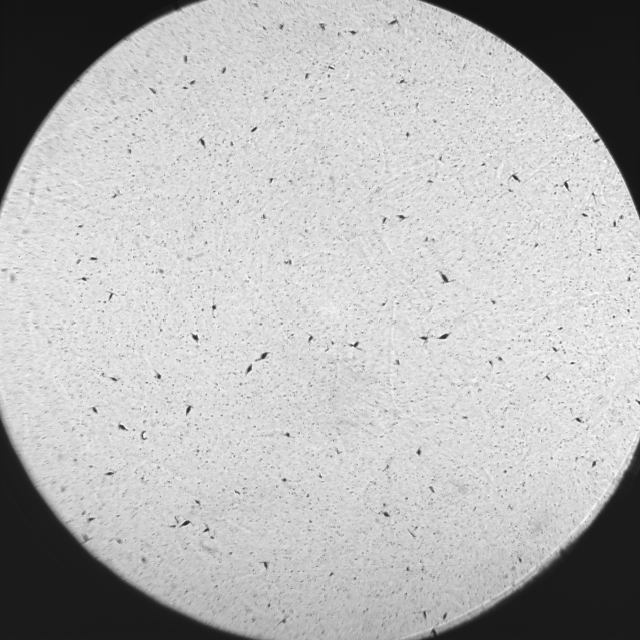

In [ ]:
# Panoptic Segmentation Visualizer
# We can use `Visualizer` to draw the predictions on the image.
predictions, segmentInfo = predictor(im)["panoptic_seg"]
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1)
# Uncomment to filter out specific segments
# out = v.draw_panoptic_seg_predictions(predictions.to("cpu"), list(filter(lambda x: x['category_id'] == 17, segmentInfo)), area_threshold=.1)
out = v.draw_panoptic_seg_predictions(predictions.to("cpu"), segmentInfo, area_threshold=.1)
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
!mv /content/output/model_final.pth /content/drive/MyDrive/plankton_classifier/maskRCNN/model_final.pth